# Measuring urban vitality in Trento through geospatial analysis
The current project was developed for the 'Geospatial analysis and representation for data science' course at the University of Trento.


All the paragraphs and the coding were written by Maja Dall'Acqua (contact email: maja.dallacqua@studenti.unitn.it). 

## Libraries
Here one can see all the libraries necessary to conduct the following analyses.

Before continuing be sure to have download all the python packages reported in the project description.

In [1]:
# general libraries
import pandas as pd
import numpy as np
import geopandas as gpd
import requests

# libraries for computations
from shapely.geometry import Polygon, Point
from pysal.lib import weights
import libpysal
from esda.moran import Moran

# visualization libraries
import matplotlib.pyplot as plt
import plotly.express as px

## Data preparation
In this section it is explained the process through which data are collected and modified before proceeding with the analysis.
 
Data retrieved from OpenStreetmap are written in the WGS 84 (EPSG:4326) reference system.

Data retrieved from the Trento Open data page are written in the ETRS89 / UTM zone 32N (EPSG:25832) reference system.

To perform the analysis all the data were transformed into the EPSG:25832 reference system.

### Data collection
Data were collected from the Openstreetmap dataset and from the open data archive of the city of Trento.

#### data from OpenStreetMap (through Overpass'API)

In [2]:
city = "Trento"
overpass_url = "http://overpass-api.de/api/interpreter"

In [3]:
# DIMENSION D and A(INDICATORS 6 and 1)
# here we retrieve points of interest (nodes) inside the administrative borders of the city satisfying specific urban functions

queries = {
    # pois satisfying economic function 
    "economic" : f"""[out:json];
    area["name"={city}]->.searchArea;
    (node["amenity"="bank"](area.searchArea);
    );
    out center;
    """,
    # pois satisfying education function 
    "education": f"""[out:json];
    area["name"={city}]->.searchArea;
    (node["amenity"~"kindergarten|school|university"](area.searchArea);
    );
    out center;
    """,
    # pois satisfying commercial function 
    "commercial": f"""[out:json];
    area["name"={city}]->.searchArea;
    (node["shop"](area.searchArea);
    );
    out center;
    """,
    # pois satisfying health function
    "health": f"""[out:json];
    area["name"={city}]->.searchArea;
    (node["amenity"~"hospital|pharmacy"](area.searchArea);
    );
    out center;
    """,
    # pois satisfying tourism function 
    "tourism": f"""[out:json];
    area["name"={city}]->.searchArea;
    (node["tourism"](area.searchArea);
    );
    out center;
    """,
    # pois satisfying ristoration function 
    "ristoration": f"""[out:json];
    area["name"={city}]->.searchArea;
    (node["amenity"~"bar|restaurant|cafe"](area.searchArea);
    );
    out center;
    """
}

urban_functions = []

for el in queries.keys(): # pass each query to the overpass interpreter to retrieve data from openstreetmap
    current_response = requests.get(overpass_url, 
                        params={'data': queries[el]})
    retrieved_data = current_response.json()
    #print(retrieved_data)
    for point in retrieved_data['elements']: # extract each node with the infromation needed
        current_el = {
            'id': point['id'],
            'latitude': point['lat'],
            'longitude': point['lon'],
            'function': el}
        urban_functions.append(current_el) # append the node to the external list
    print(f"for function {el} {len(retrieved_data['elements'])} elements were stored")
    

df_urban_functions = pd.DataFrame(urban_functions) # construct the DataFrame with all the nodes retrieved

# convert the dataframe into a geoDataFrame
geo_urban_functions = gpd.GeoDataFrame(
    df_urban_functions,
    crs='EPSG:4326', 
    geometry = gpd.points_from_xy(df_urban_functions.longitude, df_urban_functions.latitude)
    )

geo_urban_functions = geo_urban_functions.to_crs("EPSG:25832") # coordinate system we want to use

for function economic 66 elements were stored
for function education 45 elements were stored
for function commercial 1226 elements were stored
for function health 36 elements were stored
for function tourism 612 elements were stored
for function ristoration 416 elements were stored


In [4]:
# DIMENSION B (INDICATOR 3)
# here we retrieve busses and railway stops (nodes) inside the administrative borders of the city

transportation_query = f"""[out:json];
    area["name"={city}]->.searchArea;
    (node["highway"="bus_stop"](area.searchArea);
    node["railway"="tram_stop"](area.searchArea);
    );
    out center;
"""
current_response = requests.get(overpass_url, # pass the query to the overpass interpreter to retrieve data from openstreetmap
                    params={'data': transportation_query})
retrieved_data = current_response.json()

transportation = []
for point in retrieved_data['elements']: # extract each node with the infromation needed
    current_el = {
        'id': point['id'],
        'latitude': point['lat'],
        'longitude': point['lon'],
        'function': 'transportation'}
    transportation.append(current_el) # append the node to the external list
    
print(f"{len(transportation)} elements were stored")

df_transportation = pd.DataFrame(transportation) # construct the DataFrame

# convert into a geoDataFrame
geo_transportation = gpd.GeoDataFrame(
    df_transportation,
    crs="EPSG:4326", # coordinate system we want to use
    geometry = gpd.points_from_xy(df_transportation.longitude, df_transportation.latitude))

geo_transportation = geo_transportation.to_crs("EPSG:25832") # coordinate system we want to use

705 elements were stored


#### data from Trento Open Data Hub

In [5]:
# DIMENSION C and D (INDICATORS 4 and 5)
landuse_df = gpd.read_file('https://gis.comune.trento.it/dbexport?db=base&sc=uso_suolo&ly=usosuolo_view&fr=geojson')
landuse_df.crs # to check the reference system
#landuse_df

<Projected CRS: EPSG:25832>
Name: ETRS89 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 6°E and 12°E: Austria; Belgium; Denmark - onshore and offshore; Germany - onshore and offshore; Norway including - onshore and offshore; Spain - offshore.
- bounds: (6.0, 38.76, 12.01, 84.33)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [6]:
# DIMENSION B (INDICATORS 3)
street_df = gpd.read_file('https://gis.comune.trento.it/dbexport?db=base&sc=toponomastica&ly=grafo_web&fr=geojson')
street_df.crs # to check the reference system
#street_df

<Projected CRS: EPSG:25832>
Name: ETRS89 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 6°E and 12°E: Austria; Belgium; Denmark - onshore and offshore; Germany - onshore and offshore; Norway including - onshore and offshore; Spain - offshore.
- bounds: (6.0, 38.76, 12.01, 84.33)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [7]:
# retrieve the units of our analysis: the city's neighborhoods.
geo_neigh = gpd.read_file('http://gis.comune.trento.it/dbexport?db=base&sc=confini&ly=poli_sociali&fr=geojson')
geo_neigh.crs # to check the reference system
#geo_neigh

<Projected CRS: EPSG:25832>
Name: ETRS89 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 6°E and 12°E: Austria; Belgium; Denmark - onshore and offshore; Germany - onshore and offshore; Norway including - onshore and offshore; Spain - offshore.
- bounds: (6.0, 38.76, 12.01, 84.33)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [8]:
# by looking at the dataframe we notice that there are two units with the same name (SAN DONA'-LASTE) but with different geometries
# we will rename them differently to avoid future problems
geo_neigh.loc[8, 'nome_quart'] = "SAN DONA'-LASTE 1"
geo_neigh.loc[45, 'nome_quart'] = "SAN DONA'-LASTE 2"
print(f"there are {geo_neigh.shape[0]} units in the dataset")

there are 48 units in the dataset


In [9]:
# create this dataframe for next computations
neigh_area = geo_neigh[['area', 'nome_quart']]

### Data cleaning
We'll plot the data to see if they've been correctly encoded and if may appear any problem in the 
previous steps.
! We plot the nodes using the latitude and longitude information (still encoded in the EPSG:4326 system) since Plotly Express requires the input GeoDataFrame to be in EPSG:4326 (WGS 84) by default.

!! By shrinking the plot of the POIs related to the urban functions one can notice that some nodes are located in other part of the world (like in South America). To simplify the analysis these points will be directly excluded from the following computation.

In [10]:
# plot the distribution of POIs across the city
fig = px.scatter_mapbox(df_urban_functions,
                        lat=df_urban_functions['latitude'],
                        lon=df_urban_functions['longitude'],
                        color = df_urban_functions['function'],
                        center = {"lat": 46.0678700, "lon": 11.1210800},
                        zoom=10)

fig.update_layout(mapbox_style="open-street-map")
fig.show()

In [11]:
# plot the distribution of bus stops across the city
fig = px.scatter_mapbox(geo_transportation,
                        lat=geo_transportation['latitude'],
                        lon=geo_transportation['longitude'],
                        center = {"lat": 46.0678700, "lon": 11.1210800},
                        zoom=10)

fig.update_layout(mapbox_style="open-street-map")
fig.show()

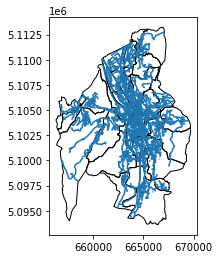

In [12]:
# plot the street network in the city
street_df.plot()
geo_neigh.plot(ax=plt.gca(), facecolor='none', edgecolor='black')
plt.show()

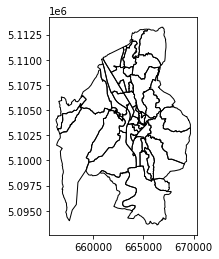

In [13]:
# plot the poli sociali
geo_neigh.plot(facecolor='none', edgecolor='black')
plt.show()

### Data preprocessing
The following steps are needed to compute all the indicators for each of the unit of the analysis.
The order in which the indicators are calculated is such to minimize the number of operation needed.
At the end of these computations we'll obtain a dataframe with all the indicators computed for each unit.

#### indicators 1 and 6

In [14]:
# we merge two dataframes considering the points from geo_urban_functions contained in the polygons of geo_neigh
pois_in_neigh = gpd.sjoin(geo_urban_functions, geo_neigh, how="right", predicate="within")

# we group by neighborhood and function to count how many POIs satisfying each urban function are contained in each neighborhood
poi_neigh = pois_in_neigh.groupby(['nome_quart', 'function'], dropna=False).size().unstack(fill_value=0)

poi_neigh.reset_index(inplace=True) #reset the index

# check if there are missing neighborhoods (the ones in which no point was found)
missing_poi_neigh = set(geo_neigh['nome_quart']) - set(poi_neigh['nome_quart'])

if missing_poi_neigh:
    print("Missing neighborhoods:", missing_poi_neigh)
else:
    print("All neighborhoods are present.")
# ------------------------------------------------------------------------------------------------

# in this section we compute the entropy through the Shannon index to define the level of function diversity
poi_neigh_copy = poi_neigh.copy() # we create a copy of the dataframe to avoid persistent errors

functions = ['commercial', 'economic', 'education', 'health', 'ristoration', 'tourism']

for col in functions:
    new_col_name = f'{col}_rate' # for each function we create a new column with the rate
    poi_neigh_copy[new_col_name] = poi_neigh_copy[col].div(poi_neigh_copy[functions].sum(axis=1)) #compute the rate

    
# we keep only the rates to compute the entropy
poi_neigh_rate = poi_neigh_copy[['commercial_rate','economic_rate','education_rate','health_rate','ristoration_rate','tourism_rate']]
poi_neigh_rate = poi_neigh_rate.fillna(0) # allows us to still consider the units with no points
poi_neigh_rate = poi_neigh_rate + 1e-10  # we add a small constant to avoid errors from Nan values

# now we compute the entropy through the Shannon diversity index
poi_neigh_copy['entropy'] = -np.sum(poi_neigh_rate * np.log(poi_neigh_rate), axis=1)
# ----------------------------------------------------------------------------------------------

# now we merge the new dataframe with the neigh_area df
complete_rates = poi_neigh_copy.merge(neigh_area, on='nome_quart') 

# since the distribution of the POIs in the neighborhoods may be sparse we normalize the indicators dividing by the area of the unit.
complete_rates['indicator 6'] = complete_rates['entropy']/complete_rates['area']
complete_rates['indicator 1'] = complete_rates['commercial_rate']/complete_rates['area']
complete_rates['indicator 1'] = complete_rates['indicator 1'].fillna(0)

indicators_1_6 = complete_rates[['indicator 6', 'indicator 1', 'nome_quart']]
print(f"there are {indicators_1_6 .shape[0]} units in the dataset") # to check we're not losing something

All neighborhoods are present.
there are 48 units in the dataset


Here we plot again the POIs to check that the ones with coordinates not in Trento have been excluded (the process is automatically implemented in the spatial join with the within function). Indeed only POIs contained in the polygons will be counted.

In [15]:
# plot the distribution of POIs across the city
fig = px.scatter_mapbox(pois_in_neigh,
                        lat=pois_in_neigh['latitude'],
                        lon=pois_in_neigh['longitude'],
                        color = pois_in_neigh['function'],
                        center = {"lat": 46.0678700, "lon": 11.1210800},
                        zoom=10)

fig.update_layout(mapbox_style="open-street-map")
fig.show()

In [12]:
# check
#indicators_1_6

#### indicator 2
Indicator 2 (transportation availablity) was computed calulating the total number of transportation stops inside each unit.

In [16]:
# the function sjoins allows to merge two dataframes considering the points from geo_transportation contained in the polygons of geo_neigh
stops_in_neigh = gpd.sjoin(geo_transportation, geo_neigh, how="right", predicate="within")

# Group by polygon_id and the chosen column, then count the points
stops_neigh = stops_in_neigh.groupby(['nome_quart']).size().reset_index(name='total stops')

# Reset index for a cleaner DataFrame
stops_neigh.reset_index(drop=True, inplace=True)

missing_stops_neigh = set(geo_neigh['nome_quart']) - set(stops_in_neigh['nome_quart'].unique())

# dispaly missing neighborhoods (the ones in which no point was found)
if missing_stops_neigh:
    print("Missing neighborhoods:", missing_stops_neigh)
else:
    print("All neighborhoods are present.")
    
indicators_2 = geo_neigh.merge(stops_neigh, on='nome_quart', how='left')

# then we normalized the indicators considering thearea of each neighborhood
indicators_2['indicator 2'] = indicators_2['total stops'] / indicators_2['area']

indicators_2 = indicators_2[['indicator 2', 'nome_quart']]
print(f"there are {indicators_2.shape[0]} units in the dataset") # to check we're not losing something

All neighborhoods are present.
there are 48 units in the dataset


In [12]:
# check
#indicators_2

#### indicators 4 and 5

In [18]:
# we compute the intersection of lands and neighborhoods 
intersection_gdf = gpd.overlay(geo_neigh, landuse_df, how='intersection')
intersection_gdf['area'] = intersection_gdf['geometry'].area

# now we group by the neighborhoods and the landuse type summing all the areas belonging to a type a landuse
result_df = intersection_gdf.groupby(['livello_iii', 'nome_quart']).agg({'area': 'sum'}).reset_index()

current_df = result_df.pivot(index='nome_quart', columns='livello_iii')['area']
# --------------------------------------------------------------------------------------------------

current_df_copy = current_df.copy()

# we drop the landuse with a lot of Nan values: 
current_df_copy = current_df_copy.drop(labels=['Aree a pascolo naturale e praterie', 'Aree estrattive', 'Bacini di acqua', 
               'Discariche', 'Rocce nude, falesie, rupi, affioramenti'], axis=1)

landuse = current_df_copy.columns # to have a list of all current landuse

current_df_copy = current_df_copy.rename_axis('nome_quart').reset_index() # make nome_quart as a column of the df

# now we merge the new dataframe with the neigh_area df
current_df_copy = current_df_copy.merge(neigh_area, on='nome_quart')

# now we can compute the rate of each landuse type
landuse_rate = []
for col in landuse:
    new_col_name = f'{col}_rate'
    current_df_copy[new_col_name] = current_df_copy[col].div(current_df_copy[landuse].sum(axis=1))
    landuse_rate.append(new_col_name)
    
# now we retrieve the df for the entropy computation
df_entropy = current_df_copy[landuse_rate]

# now we compute the entropy through the Shannon diversity index
current_df_copy['entropy'] = -np.sum(df_entropy * np.log(df_entropy), axis=1) # this is indicator 5!
current_df_copy['entropy normalized'] = current_df_copy['entropy']/current_df_copy['area']
# --------------------------------------------------------------------------------------------------

# we can also sum the green area to obtain the green area rate
green_use = ['Aree verdi, ricreative e sportive','Boschi misti',
            'Colture temporanee associate a colture permanenti', 'Frutteti e frutti minori',
            'Prati stabili (foraggere permanenti)', 'Vigneti']
current_df_copy['total green area rate'] = current_df_copy[green_use].sum(axis=1).div(current_df_copy[landuse].sum(axis=1))

# now we reconstruct the dataframe
indicators_4_5 = current_df_copy[['nome_quart', 'entropy normalized', 'total green area rate']]
indicators_4_5.columns = ['nome_quart', 'indicator 5', 'indicator 4'] # rename for convenience
print(f"there are {indicators_4_5.shape[0]} units in the dataset") # to check we're not losing something

there are 48 units in the dataset


In [14]:
# check
#indicators_4_5

#### indicator 3

In [19]:
street_df['length'] = street_df['geometry'].length

# we associate each street with its corresponding neighborhood
streets_in_neigh = gpd.sjoin(street_df, geo_neigh, how='right', predicate='within')

# we group by neighborhood to calculate the total length of streets in each neighborhood
streets_by_neigh = streets_in_neigh.groupby('nome_quart')['length'].sum()

indicators_3 = geo_neigh.merge(streets_by_neigh, left_on='nome_quart', right_index=True, how='left')

# then we normalized the indicators considering thearea of each neighborhood
indicators_3['indicator 3'] = indicators_3['length'] / indicators_3['area']

indicators_3 = indicators_3[['nome_quart', 'length', 'indicator 3']]
print(f"there are {indicators_3.shape[0]} units in the dataset") # to check we're not losing something

there are 48 units in the dataset


In [16]:
# check
#indicators_3

### Dataset construction
Here we merge together all the indicators to proceede with the analysis

In [20]:
final_df = geo_neigh.merge(indicators_1_6, on='nome_quart')
final_df = final_df.merge(indicators_4_5, on='nome_quart')
final_df = final_df.merge(indicators_2, on='nome_quart')
final_df = final_df.merge(indicators_3, on='nome_quart')

final_df = final_df[['nome_quart', 'geometry', 'indicator 1', 'indicator 2', 
                     'indicator 3', 'indicator 4', 'indicator 5', 'indicator 6']]

In [21]:
# to check
print(f"there are {final_df.shape[0]} units in the final dataset") # to check we're not losing something

there are 48 units in the final dataset


In [22]:
# here one can see the final dataset obtained after computing the indicators
final_df

,nome_quart,geometry,indicator 1,indicator 2,indicator 3,indicator 4,indicator 5,indicator 6
0,SAN PIO X,"POLYGON ((664351.625 5102511.000, 664256.750 5...",3.139760e-06,2.866738e-05,0.013155,0.079411,4.990733e-06,3.138133e-06
1,CAMPOTRENTINO,"POLYGON ((663035.917 5106708.823, 663192.438 5...",5.458687e-07,5.270457e-06,0.009078,0.404558,1.117566e-06,3.527143e-07
2,SAN BARTOLOMEO,"POLYGON ((665214.735 5101925.368, 665242.003 5...",1.413877e-06,1.454273e-05,0.006422,0.271165,3.340391e-06,1.242929e-06
3,VILLAZZANO,"POLYGON ((665497.049 5102617.690, 665502.035 5...",3.161317e-08,4.893719e-06,0.003952,0.839501,1.636561e-07,1.367102e-07
4,CLARINA,"POLYGON ((664147.125 5102159.000, 664223.750 5...",3.290325e-07,1.371207e-05,0.011717,0.262684,1.071047e-06,5.413636e-07
5,MELTA,"POLYGON ((663870.532 5107670.779, 663952.038 5...",2.126848e-06,1.640712e-05,0.010978,0.434713,5.033259e-06,1.869697e-06
6,CANOVA,"POLYGON ((662448.562 5107668.500, 662470.938 5...",1.556104e-06,1.414640e-05,0.010876,0.279262,3.207840e-06,7.838991e-07
7,SOLTERI-CENTOCHIAVI,"POLYGON ((664014.141 5106760.801, 664022.761 5...",7.245878e-07,2.542168e-05,0.012172,0.155616,1.447327e-06,6.311918e-07
8,SAN DONA'-LASTE 1,"POLYGON ((664296.891 5105785.202, 664299.943 5...",0.000000e+00,2.088031e-05,0.001821,0.399353,1.184394e-05,7.943516e-14
9,SPINI-GHIAIE,"POLYGON ((661000.290 5110098.597, 661002.582 5...",2.651705e-07,1.157108e-05,0.005573,0.329249,6.239589e-07,3.099509e-07


## Data analysis

In [23]:
# for further computations
indicators = ['indicator 1', 'indicator 2', 'indicator 3', 'indicator 4', 'indicator 5', 'indicator 6']

### indicators normalization
To normalize the indicators the z-score standardization was used. : z = (x - mean) / std.

In [24]:
# we create a copy of the dataframe to compute the normalization
normalized_indicators = final_df.copy()


for col in indicators:
    # we replace each indicator with its standardized version
    normalized_indicators[col] = (final_df[col].subtract(final_df[col].mean())).div(final_df[col].std())

In [25]:
# check
normalized_indicators # this indicators are now more easy to interpret and analyze

,nome_quart,geometry,indicator 1,indicator 2,indicator 3,indicator 4,indicator 5,indicator 6
0,SAN PIO X,"POLYGON ((664351.625 5102511.000, 664256.750 5...",2.646824,1.718942,1.246500,-1.480054,0.348203,1.720104
1,CAMPOTRENTINO,"POLYGON ((663035.917 5106708.823, 663192.438 5...",-0.039453,-0.621561,0.463192,-0.416303,-0.290704,-0.370367
2,SAN BARTOLOMEO,"POLYGON ((665214.735 5101925.368, 665242.003 5...",0.859470,0.305988,-0.046945,-0.852711,0.075967,0.297744
3,VILLAZZANO,"POLYGON ((665497.049 5102617.690, 665502.035 5...",-0.572025,-0.659248,-0.521543,1.006656,-0.448058,-0.532479
4,CLARINA,"POLYGON ((664147.125 5102159.000, 664223.750 5...",-0.264012,0.222893,0.970312,-0.880460,-0.298378,-0.228785
5,MELTA,"POLYGON ((663870.532 5107670.779, 663952.038 5...",1.597836,0.492491,0.828222,-0.317649,0.355218,0.768136
6,CANOVA,"POLYGON ((662448.562 5107668.500, 662470.938 5...",1.006763,0.266341,0.808770,-0.826222,0.054102,-0.046761
7,SOLTERI-CENTOCHIAVI,"POLYGON ((664014.141 5106760.801, 664022.761 5...",0.145631,1.394260,1.057702,-1.230742,-0.236307,-0.161368
8,SAN DONA'-LASTE 1,"POLYGON ((664296.891 5105785.202, 664299.943 5...",-0.604764,0.939966,-0.930983,-0.433334,1.478689,-0.635081
9,SPINI-GHIAIE,"POLYGON ((661000.290 5110098.597, 661002.582 5...",-0.330149,0.008720,-0.210206,-0.662685,-0.372128,-0.402461


### spatial matrix construction
We construct the spatial matrix using the Queen contiguity to define units as neighbors or not.

In [26]:
spatial_weights = weights.Queen.from_dataframe(normalized_indicators)

### Moran's spatial autocorrelation index

In [27]:
indicators_list =[]
moran_list =[]
pvalue_list =[]

for indicator in indicators:
    moran =  Moran(normalized_indicators[indicator].values, spatial_weights)
    indicators_list.append(indicator)
    moran_list.append(moran.I)
    pvalue_list.append(moran.p_norm)
    
moran_data = {'indicator': indicators_list,
             'moran index': moran_list,
             'p_value': pvalue_list}

moran_df = pd.DataFrame(moran_data)
moran_df

,indicator,moran index,p_value
0,indicator 1,0.226893,5.399591e-03
1,indicator 2,0.528571,7.083012e-10
2,indicator 3,0.561904,6.238388e-11
3,indicator 4,0.638344,1.414424e-13
4,indicator 5,0.006096,7.589428e-01
5,indicator 6,0.407633,1.521320e-06


we can see that all the indicators, except for the 5, have medium-high values for the Moran index and a small p-value, which means that the spatial autocorrelations are statistically significant.

Therefore we decide to continue the analysis using all the indicators except for indicator numer 5 (the land use diversity)

In [28]:
filtered_indicators = ['indicator 1', 'indicator 2', 'indicator 3', 'indicator 4', 'indicator 6']

### Spatial empirical Bayes smoothing computation

In [29]:
for indicator in filtered_indicators:
    indicator_values = normalized_indicators[indicator].values[:, None]

    spatial_lag = libpysal.weights.lag_spatial(spatial_weights, indicator_values) # here we compute the spatial lag

    weight_parameter = 0.5 # here we adjust the local estimates using a weight parameter equal for all indicators
    smoothed_values = weight_parameter * spatial_lag + (1 - weight_parameter) * indicator_values 

    normalized_indicators[f'seb_{indicator}'] = smoothed_values.flatten() # here we smooth the values computed


### Urban vitality index construction

In [30]:
# we assign equal weights to all the indicators
weights = [1/len(filtered_indicators)] * len(filtered_indicators)  

# the urban vitality index is given by the sum of all weights*indicators
normalized_indicators['vitality index'] = sum(weight * normalized_indicators[f'seb_{indicator}'] for weight, indicator in zip(weights, filtered_indicators))


In [31]:
# see the final result
vitality_index_df = normalized_indicators[['nome_quart', 'geometry', 'vitality index']]

# create a copy of the dataframe
vitality_index_df['vitality index std'] = (vitality_index_df['vitality index'].subtract(vitality_index_df['vitality index'].mean())).div(vitality_index_df['vitality index'].std())
vitality_index_df

/Users/majadallacqua/opt/anaconda3/lib/python3.9/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,nome_quart,geometry,vitality index,vitality index std
0,SAN PIO X,"POLYGON ((664351.625 5102511.000, 664256.750 5...",0.604186,1.449071
1,CAMPOTRENTINO,"POLYGON ((663035.917 5106708.823, 663192.438 5...",-0.093969,-0.192314
2,SAN BARTOLOMEO,"POLYGON ((665214.735 5101925.368, 665242.003 5...",0.009504,0.050953
3,VILLAZZANO,"POLYGON ((665497.049 5102617.690, 665502.035 5...",-0.214829,-0.476461
4,CLARINA,"POLYGON ((664147.125 5102159.000, 664223.750 5...",-0.008240,0.009237
5,MELTA,"POLYGON ((663870.532 5107670.779, 663952.038 5...",0.339001,0.825613
6,CANOVA,"POLYGON ((662448.562 5107668.500, 662470.938 5...",0.091000,0.242554
7,SOLTERI-CENTOCHIAVI,"POLYGON ((664014.141 5106760.801, 664022.761 5...",0.173411,0.436305
8,SAN DONA'-LASTE 1,"POLYGON ((664296.891 5105785.202, 664299.943 5...",-0.024781,-0.029652
9,SPINI-GHIAIE,"POLYGON ((661000.290 5110098.597, 661002.582 5...",-0.210844,-0.467092


## Results
Here we visualize the results obtained for the urban vitality index.

In [32]:
# we group the urban vitality index into 5 categories: very low, low, medium, high, very high level
vitality_index_df['vitality level'] = pd.qcut(
    vitality_index_df['vitality index std'], 
    [0, 0.2, 0.4, 0.6, 0.8, 1], 
    labels=['very low', 'low', 'medium', 'high', 'very high'])

/Users/majadallacqua/opt/anaconda3/lib/python3.9/site-packages/geopandas/geodataframe.py:1525: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [33]:
vitality_index_df

,nome_quart,geometry,vitality index,vitality index std,vitality level
0,SAN PIO X,"POLYGON ((664351.625 5102511.000, 664256.750 5...",0.604186,1.449071,very high
1,CAMPOTRENTINO,"POLYGON ((663035.917 5106708.823, 663192.438 5...",-0.093969,-0.192314,medium
2,SAN BARTOLOMEO,"POLYGON ((665214.735 5101925.368, 665242.003 5...",0.009504,0.050953,high
3,VILLAZZANO,"POLYGON ((665497.049 5102617.690, 665502.035 5...",-0.214829,-0.476461,medium
4,CLARINA,"POLYGON ((664147.125 5102159.000, 664223.750 5...",-0.008240,0.009237,high
5,MELTA,"POLYGON ((663870.532 5107670.779, 663952.038 5...",0.339001,0.825613,very high
6,CANOVA,"POLYGON ((662448.562 5107668.500, 662470.938 5...",0.091000,0.242554,high
7,SOLTERI-CENTOCHIAVI,"POLYGON ((664014.141 5106760.801, 664022.761 5...",0.173411,0.436305,high
8,SAN DONA'-LASTE 1,"POLYGON ((664296.891 5105785.202, 664299.943 5...",-0.024781,-0.029652,high
9,SPINI-GHIAIE,"POLYGON ((661000.290 5110098.597, 661002.582 5...",-0.210844,-0.467092,medium


To plot the units by the level of urban vitality we need tochange the coordinate system, since Plotly Express requires the input GeoDataFrame to be in EPSG:4326 (WGS 84) by default.

In [36]:
# plot by vitality level
vitality_index_crs = vitality_index_df.to_crs(epsg=4326)

legend_order = ['very low', 'low', 'medium', 'high', 'very high']
fig = px.choropleth_mapbox(vitality_index_crs,
                           geojson=vitality_index_crs.geometry,
                           locations=vitality_index_crs.index,
                           color=vitality_index_crs['vitality level'],
                           hover_name=vitality_index_crs["nome_quart"],
                           center={"lat": 46.0678700, "lon": 11.1210800},
                           mapbox_style="open-street-map",
                           category_orders={"vitality level": legend_order}, 
                           zoom=8.5)
fig.show()

/Users/majadallacqua/opt/anaconda3/lib/python3.9/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

